# Начало работы, загрузка библиотек

In [1]:
# устанавливаем пакеты

!pip install pandas 
!pip install numpy 
!pip install matplotlib 
!pip install sklearn
!pip install seaborn
!pip install pandas_profiling

In [1]:
# импортируем пакеты

import seaborn as sbn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling as pp
import sklearn as skl
import random as rnd
import tensorflow as tf


In [2]:
# импортируем модули и объекты

from pandas import read_excel, DataFrame, Series
from pandas_profiling import ProfileReport 
from numpy.random import seed

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, Normalizer, PowerTransformer
from sklearn.model_selection import train_test_split, KFold, GridSearchCV, cross_val_score, cross_val_predict, StratifiedKFold, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, LogisticRegression, Perceptron, SGDClassifier, ElasticNet
from sklearn import metrics 
from sklearn.svm import SVC, LinearSVC, SVR
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error, r2_score
from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import GenericUnivariateSelect, mutual_info_classif, SelectFromModel
from sklearn.neural_network import MLPRegressor

from tensorflow import keras 
from tensorflow.keras.layers import Dense 
from tensorflow.keras.layers import Flatten 

from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import Sequential
from keras.layers import Activation, Dropout





In [3]:

# Отрисовываем график сразу в тетрадке, а не в отдельном окне

%matplotlib inline

# 1. Постановка задачи

#### Задача: Прогнозирование конечных свойств новых материалов (композиционных материалов).   

На входе имеются данные о начальных свойствах компонентов композиционных материалов (количество связующего, наполнителя, температурный режим отверждения и т.д.). На выходе необходимо спрогнозировать ряд конечных свойств получаемых композиционных материалов.  

На выходе (спрогнозировать): Соотношение матрица-наполнитель, Модуль упругости при растяжении, Прочность при растяжении


# 2. Получение данных, знакомство с данными

## 2.1 Загрузка данных

In [4]:
# подготавливаем путь
data_path_1 = '.\input\X_nup.xlsx'
data_path_1=data_path_1.replace('\\', '/')

data_path_2 = '.\input\X_bp.xlsx'
data_path_2=data_path_2.replace('\\', '/')

# производим загрузку датасета
data_set_1 = pd.read_excel(data_path_1)
data_set_2 = pd.read_excel(data_path_2)


# смотрим датасеты
print(data_set_1.head()) # первый датасет
data_set_2 # второй датасет


   Unnamed: 0  Угол нашивки, град  Шаг нашивки  Плотность нашивки
0         0.0                 0.0          4.0               57.0
1         1.0                 0.0          4.0               60.0
2         2.0                 0.0          4.0               70.0
3         3.0                 0.0          5.0               47.0
4         4.0                 0.0          5.0               57.0


,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0.0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1,1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2,2.0,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3,3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4,4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...,...
1018,1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [5]:
# Разведочный анализ данных средствами pandas 1 набора данных

ProfileReport(data_set_1)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# Разведочный анализ данных средствами pandas 2 набора данных

ProfileReport(data_set_2)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 3. Подготовка, очистка, нормализация данных

In [7]:
#Объединение файлов 1 и 2 
data_set_0 = data_set_2.merge(data_set_1, left_index = True, right_index = True, how = 'inner')

data_set_0

,Unnamed: 0_x,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Unnamed: 0_y,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,0.0,4.000000,57.000000
1,1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,1.0,0.0,4.000000,60.000000
2,2.0,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,2.0,0.0,4.000000,70.000000
3,3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,3.0,0.0,5.000000,47.000000
4,4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,4.0,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1018.0,90.0,9.076380,47.019770
1019,1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1019.0,90.0,10.565614,53.750790
1020,1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1020.0,90.0,4.161154,67.629684
1021,1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1021.0,90.0,6.313201,58.261074


Общее количество данных

1023 rows × 15 columns

In [8]:
# выводим все пропущенные значения

data_set_0.isnull().mean() * 100

Unnamed: 0_x                            0.0
Соотношение матрица-наполнитель         0.0
Плотность, кг/м3                        0.0
модуль упругости, ГПа                   0.0
Количество отвердителя, м.%             0.0
Содержание эпоксидных групп,%_2         0.0
Температура вспышки, С_2                0.0
Поверхностная плотность, г/м2           0.0
Модуль упругости при растяжении, ГПа    0.0
Прочность при растяжении, МПа           0.0
Потребление смолы, г/м2                 0.0
Unnamed: 0_y                            0.0
Угол нашивки, град                      0.0
Шаг нашивки                             0.0
Плотность нашивки                       0.0
dtype: float64

In [9]:
# удаляем столбцы с индексом

data_set_0 = data_set_0.drop(['Unnamed: 0_x','Unnamed: 0_y'], axis=1)

In [10]:
# готовим копию датасета для эксперементов
data_set=data_set_0
data_set

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


In [11]:
# округляем данные в датасете


data_set=data_set.apply(np.rint)


data_set

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2.0,2030.0,739.0,30.0,22.0,100.0,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1,2.0,2030.0,739.0,50.0,24.0,285.0,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2,2.0,2030.0,739.0,50.0,33.0,285.0,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3,2.0,2030.0,739.0,129.0,21.0,300.0,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,3.0,2030.0,753.0,112.0,22.0,285.0,210.0,70.0,3000.0,220.0,0.0,5.0,57.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.0,1952.0,913.0,87.0,20.0,325.0,209.0,73.0,2387.0,125.0,90.0,9.0,47.0
1019,3.0,2050.0,445.0,146.0,20.0,254.0,351.0,73.0,2360.0,118.0,90.0,11.0,54.0
1020,3.0,1972.0,417.0,111.0,24.0,248.0,740.0,75.0,2663.0,237.0,90.0,4.0,68.0
1021,4.0,2067.0,741.0,141.0,19.0,276.0,641.0,74.0,2072.0,197.0,90.0,6.0,58.0


In [12]:
# отбираем дубли
bool_series = data_set.duplicated(subset=['Соотношение матрица-наполнитель','Прочность при растяжении, МПа','Модуль упругости при растяжении, ГПа'],keep = False)

# просматриваем данные с дублями
data_set[bool_series].shape

(35, 13)

In [13]:
# передача НЕ серии bool для просмотра только уникальных значений

data_set = data_set[~bool_series]
data_set

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
7,3.0,1900.0,535.0,112.0,22.0,285.0,380.0,75.0,1800.0,120.0,0.0,7.0,47.0
13,3.0,1980.0,568.0,129.0,21.0,300.0,470.0,73.0,2456.0,220.0,0.0,9.0,60.0
16,4.0,1880.0,313.0,129.0,21.0,300.0,210.0,70.0,3000.0,220.0,0.0,10.0,57.0
18,5.0,1890.0,540.0,129.0,21.0,300.0,380.0,75.0,1800.0,120.0,0.0,10.0,70.0
23,3.0,1953.0,1137.0,138.0,22.0,235.0,556.0,81.0,2587.0,247.0,90.0,4.0,70.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.0,1952.0,913.0,87.0,20.0,325.0,209.0,73.0,2387.0,125.0,90.0,9.0,47.0
1019,3.0,2050.0,445.0,146.0,20.0,254.0,351.0,73.0,2360.0,118.0,90.0,11.0,54.0
1020,3.0,1972.0,417.0,111.0,24.0,248.0,740.0,75.0,2663.0,237.0,90.0,4.0,68.0
1021,4.0,2067.0,741.0,141.0,19.0,276.0,641.0,74.0,2072.0,197.0,90.0,6.0,58.0


In [14]:
# смотрим попарную корреляцию

data_set.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.008122,0.020793,0.009108,0.028003,-0.015097,-0.004658,-0.011436,0.042501,0.075761,-0.028175,0.026692,0.004435
"Плотность, кг/м3",0.008122,1.000000,-0.019892,-0.030588,-0.008351,-0.011807,0.041099,-0.019602,-0.074846,-0.024899,-0.066453,-0.061235,0.084912
"модуль упругости, ГПа",0.020793,-0.019892,1.000000,0.021426,-0.002155,0.034762,-0.014928,0.010924,0.052898,-0.005808,-0.015927,-0.009786,0.057796
"Количество отвердителя, м.%",0.009108,-0.030588,0.021426,1.000000,0.016232,0.077664,0.044041,-0.079756,-0.061268,0.002558,0.040973,0.008434,0.022268
"Содержание эпоксидных групп,%_2",0.028003,-0.008351,-0.002155,0.016232,1.000000,-0.015688,0.000548,0.066952,-0.034314,0.011368,0.008463,0.016792,-0.039444
"Температура вспышки, С_2",-0.015097,-0.011807,0.034762,0.077664,-0.015688,1.000000,0.019776,0.017904,-0.032392,0.068161,0.019429,0.017479,0.009028
"Поверхностная плотность, г/м2",-0.004658,0.041099,-0.014928,0.044041,0.000548,0.019776,1.000000,0.017881,0.024248,-0.005072,0.057054,0.039401,-0.039493
"Модуль упругости при растяжении, ГПа",-0.011436,-0.019602,0.010924,-0.079756,0.066952,0.017904,0.017881,1.000000,0.006908,0.047708,0.029590,-0.033474,0.006967
"Прочность при растяжении, МПа",0.042501,-0.074846,0.052898,-0.061268,-0.034314,-0.032392,0.024248,0.006908,1.000000,0.041032,0.016844,-0.052302,0.012679
"Потребление смолы, г/м2",0.075761,-0.024899,-0.005808,0.002558,0.011368,0.068161,-0.005072,0.047708,0.041032,1.000000,-0.007255,0.009153,0.021189


In [15]:
data_set

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
7,3.0,1900.0,535.0,112.0,22.0,285.0,380.0,75.0,1800.0,120.0,0.0,7.0,47.0
13,3.0,1980.0,568.0,129.0,21.0,300.0,470.0,73.0,2456.0,220.0,0.0,9.0,60.0
16,4.0,1880.0,313.0,129.0,21.0,300.0,210.0,70.0,3000.0,220.0,0.0,10.0,57.0
18,5.0,1890.0,540.0,129.0,21.0,300.0,380.0,75.0,1800.0,120.0,0.0,10.0,70.0
23,3.0,1953.0,1137.0,138.0,22.0,235.0,556.0,81.0,2587.0,247.0,90.0,4.0,70.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.0,1952.0,913.0,87.0,20.0,325.0,209.0,73.0,2387.0,125.0,90.0,9.0,47.0
1019,3.0,2050.0,445.0,146.0,20.0,254.0,351.0,73.0,2360.0,118.0,90.0,11.0,54.0
1020,3.0,1972.0,417.0,111.0,24.0,248.0,740.0,75.0,2663.0,237.0,90.0,4.0,68.0
1021,4.0,2067.0,741.0,141.0,19.0,276.0,641.0,74.0,2072.0,197.0,90.0,6.0,58.0


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


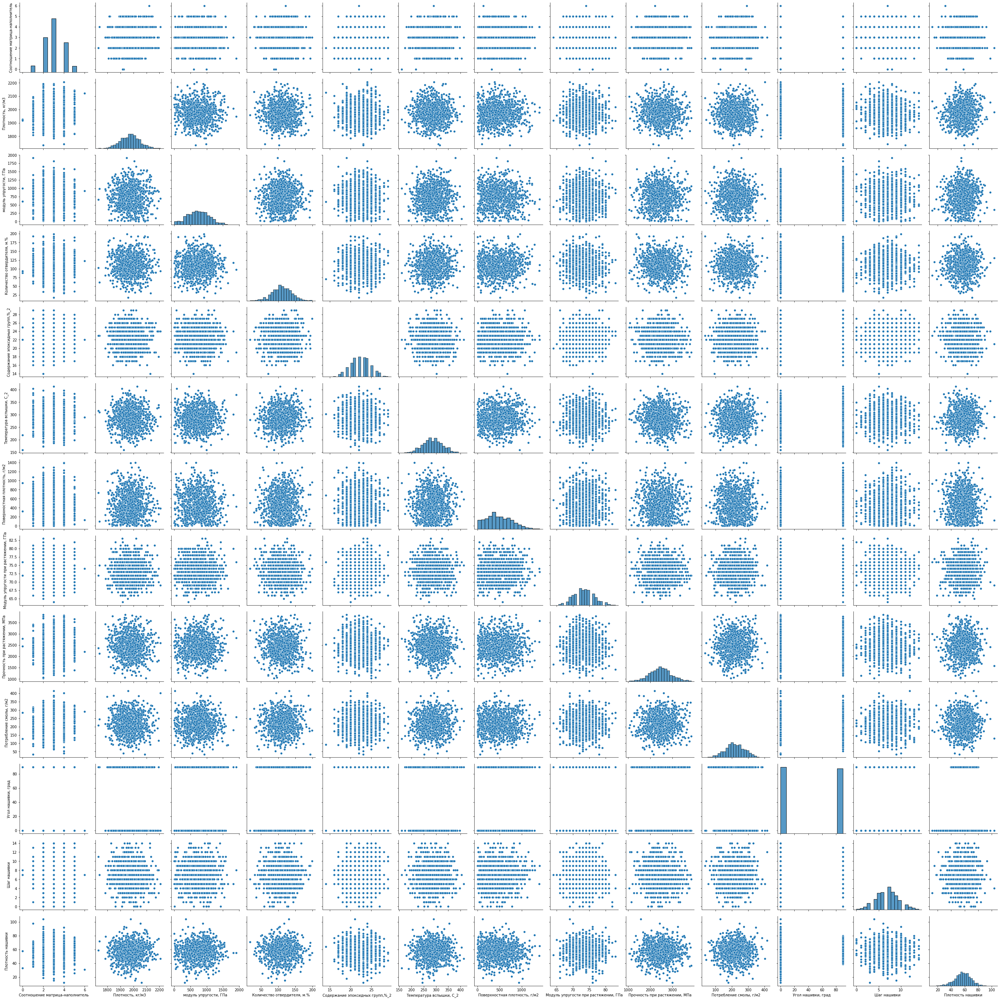

In [16]:
# отображаем все числовые столбцы данных на обеих осях, выводим матрицу зависимостей

sbn.pairplot(data_set, size=3)
plt.savefig('data_set.png')

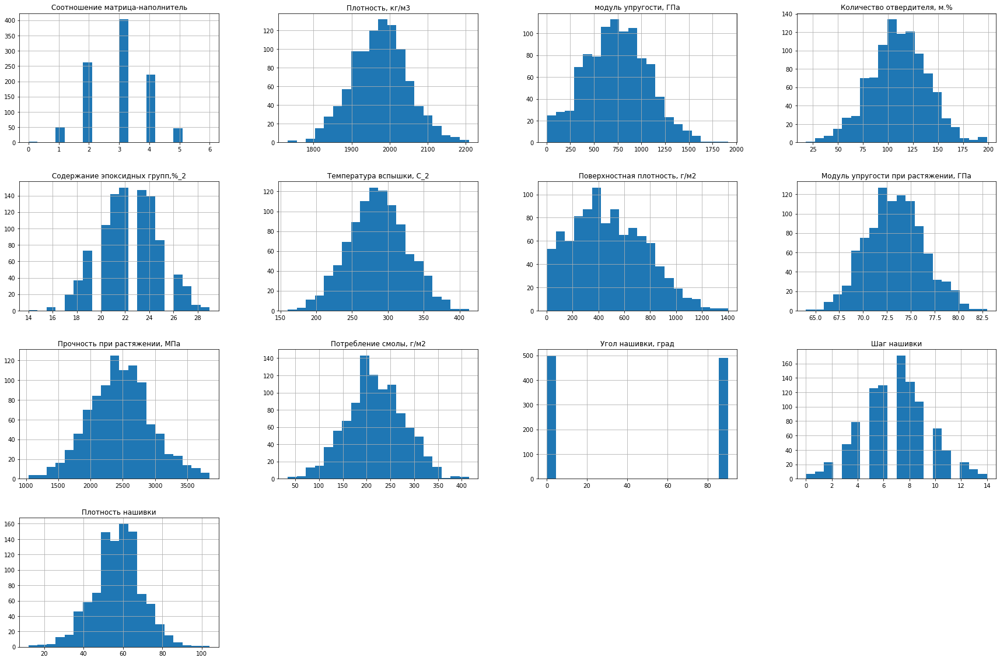

In [18]:
# построим гистограммы, показывающие распределение показателей

data_set.hist(figsize = (30, 20), bins=20)
plt.show()

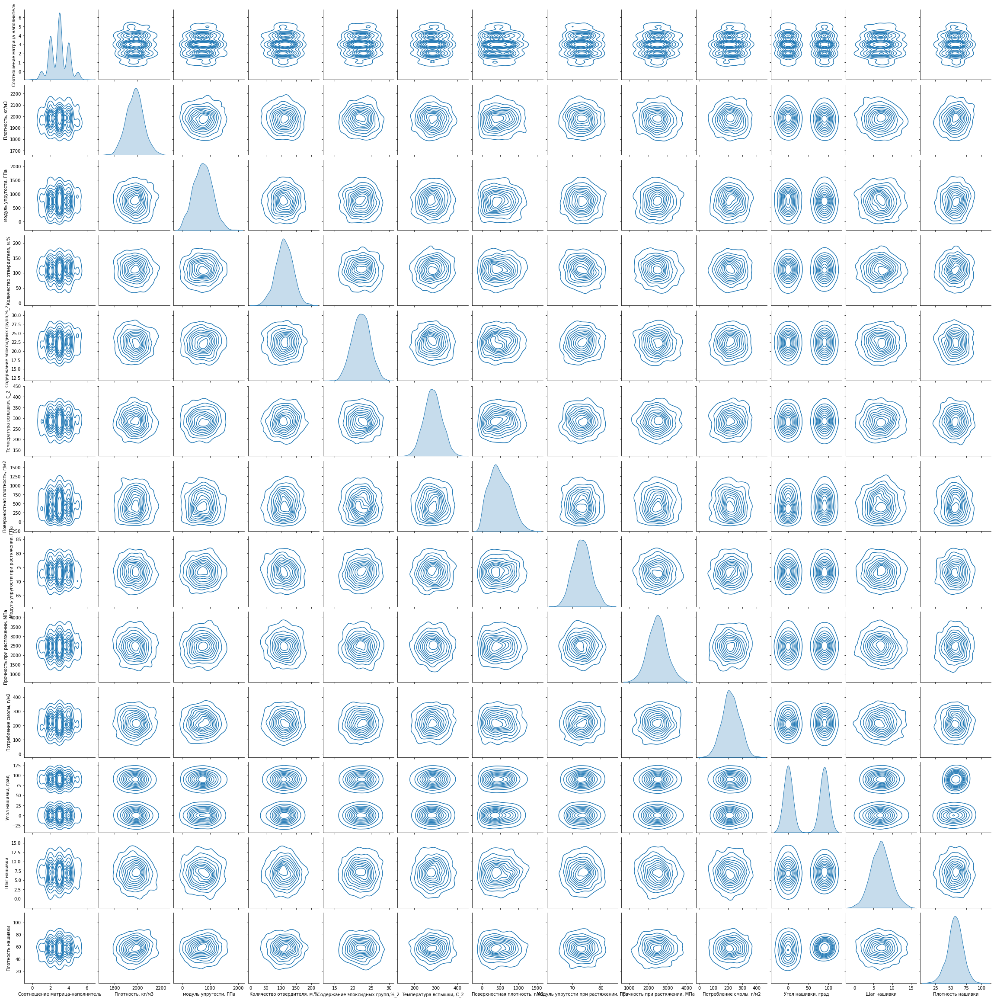

In [19]:
# смотрим зависимости

sbn.pairplot(data_set, kind = 'kde') 
# displaying the plot 
plt.show() 

In [20]:
# просматриваем информацию о столбцах

data_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 988 entries, 7 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       988 non-null    float64
 1   Плотность, кг/м3                      988 non-null    float64
 2   модуль упругости, ГПа                 988 non-null    float64
 3   Количество отвердителя, м.%           988 non-null    float64
 4   Содержание эпоксидных групп,%_2       988 non-null    float64
 5   Температура вспышки, С_2              988 non-null    float64
 6   Поверхностная плотность, г/м2         988 non-null    float64
 7   Модуль упругости при растяжении, ГПа  988 non-null    float64
 8   Прочность при растяжении, МПа         988 non-null    float64
 9   Потребление смолы, г/м2               988 non-null    float64
 10  Угол нашивки, град                    988 non-null    float64
 11  Шаг нашивки       

In [21]:
# выводим информацию о числовых параметрах

data_set.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000
mean,2.947368,1975.026316,737.480769,110.679150,22.232794,285.763158,484.296559,73.345142,2461.252024,218.535425,44.544534,6.921053,57.144737
std,0.953458,73.968717,330.389081,28.270858,2.432567,40.845554,280.483874,3.164088,485.051998,59.972890,45.020484,2.583527,12.346989
min,0.000000,1732.000000,2.000000,18.000000,14.000000,160.000000,1.000000,64.000000,1037.000000,34.000000,0.000000,0.000000,12.000000
25%,2.000000,1924.000000,498.000000,92.000000,21.000000,258.000000,269.000000,71.000000,2134.750000,179.000000,0.000000,5.000000,50.000000
50%,3.000000,1977.000000,736.500000,110.000000,22.000000,286.000000,453.000000,73.000000,2456.000000,217.000000,0.000000,7.000000,57.000000
75%,4.000000,2021.000000,958.000000,130.000000,24.000000,313.000000,694.250000,75.000000,2757.250000,258.250000,90.000000,9.000000,65.000000
max,6.000000,2208.000000,1912.000000,199.000000,29.000000,413.000000,1400.000000,83.000000,3848.000000,415.000000,90.000000,14.000000,104.000000


Count — количество значений.  
Mean — среднее значение.  
Std — стандартное отклонение значения.  
Min — минимальное значение.  
Max — максимальное значение.  
25% — первый квартиль, означающий, что 25% значений в столбце ниже этого значения.  
50% — медиана, означающая, что половина значений в столбце ниже этого значения.  
75% — третий квартиль, означающий, что 75% значений в столбце ниже этого значения.  

In [22]:
# выводим список столбцов

for col in data_set.columns:
    print(col)

Соотношение матрица-наполнитель
Плотность, кг/м3
модуль упругости, ГПа
Количество отвердителя, м.%
Содержание эпоксидных групп,%_2
Температура вспышки, С_2
Поверхностная плотность, г/м2
Модуль упругости при растяжении, ГПа
Прочность при растяжении, МПа
Потребление смолы, г/м2
Угол нашивки, град
Шаг нашивки
Плотность нашивки


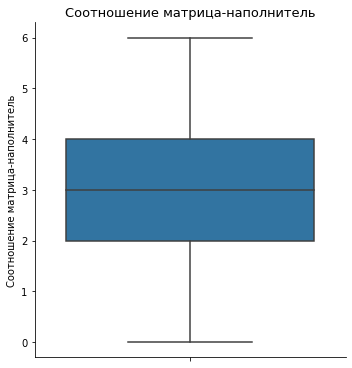

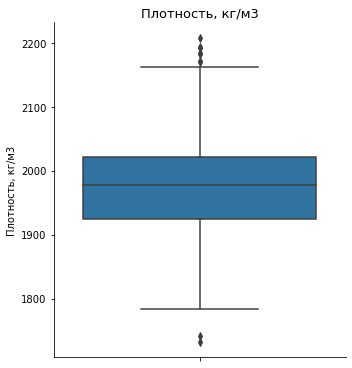

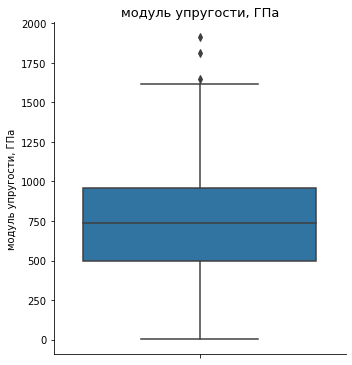

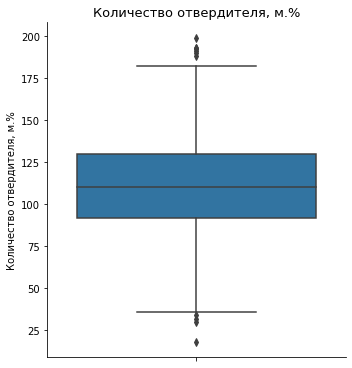

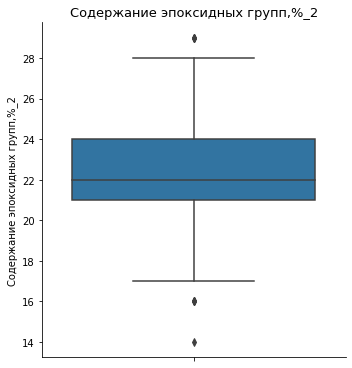

...

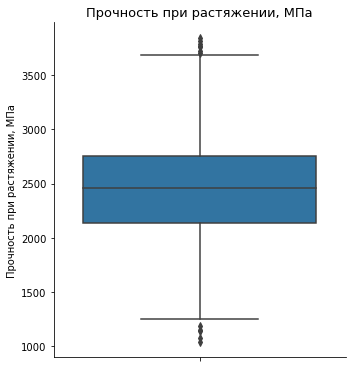

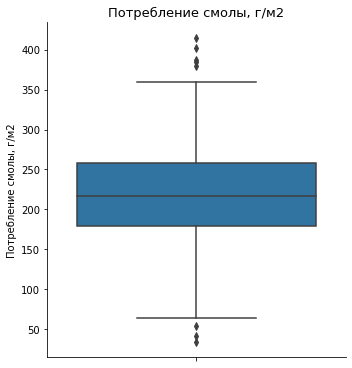

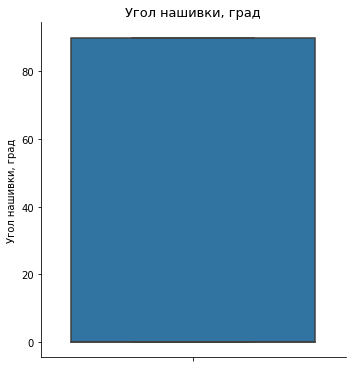

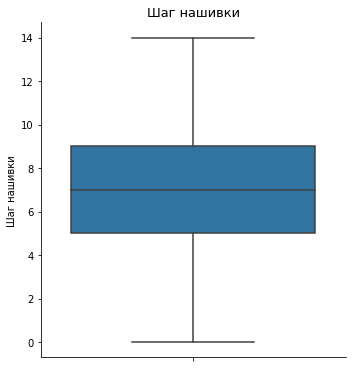

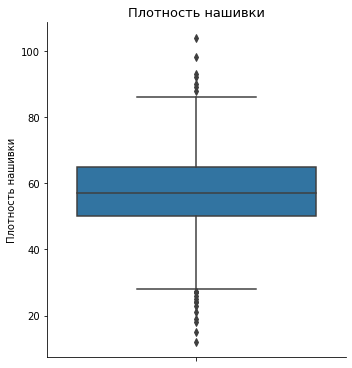

In [23]:
# производим проверку распределения одномерных вероятностей (Рисуем ящики с усами)

for col in data_set.columns:
        sbn.catplot(y = col, data = data_set, kind = 'box')
        plt.title(col, fontsize = 13) 

Ящики с усами показали наличие выбросов, производим удаление выбросов. Выбросом считается, значение в 1,5 раза больше или меньше разности 1-го и 3-го квартиля

In [24]:

#Удаляем выбросы

for x in data_set.columns:
    q75,q25 = np.percentile(data_set.loc[:,x],[75,25])
    intr_qr = q75-q25

    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)

    data_set.loc[data_set[x] < min,x] = np.nan
    data_set.loc[data_set[x] > max,x] = np.nan

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


In [25]:
# подсчитываем количество нулевых значений

data_set.isnull().sum()

Соотношение матрица-наполнитель          0
Плотность, кг/м3                         9
модуль упругости, ГПа                    3
Количество отвердителя, м.%             11
Содержание эпоксидных групп,%_2          9
Температура вспышки, С_2                 7
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     5
Прочность при растяжении, МПа           12
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              0
Плотность нашивки                       21
dtype: int64

In [26]:
#Так как количество с пробелами незначительное, решаем удалить данные

data_set = data_set.dropna(axis = 0)

In [27]:
# выводим информацию о датасете

data_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 904 entries, 7 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       904 non-null    float64
 1   Плотность, кг/м3                      904 non-null    float64
 2   модуль упругости, ГПа                 904 non-null    float64
 3   Количество отвердителя, м.%           904 non-null    float64
 4   Содержание эпоксидных групп,%_2       904 non-null    float64
 5   Температура вспышки, С_2              904 non-null    float64
 6   Поверхностная плотность, г/м2         904 non-null    float64
 7   Модуль упругости при растяжении, ГПа  904 non-null    float64
 8   Прочность при растяжении, МПа         904 non-null    float64
 9   Потребление смолы, г/м2               904 non-null    float64
 10  Угол нашивки, град                    904 non-null    float64
 11  Шаг нашивки       

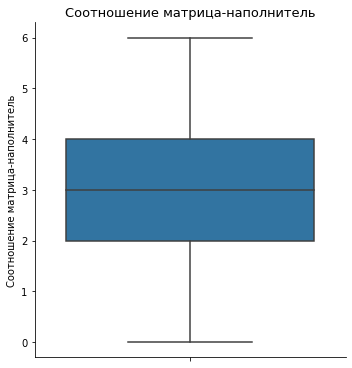

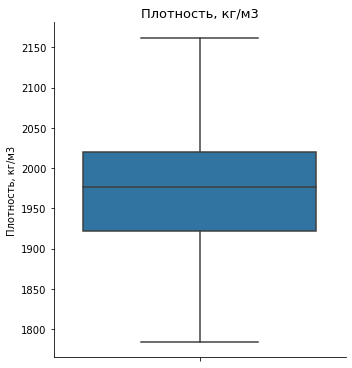

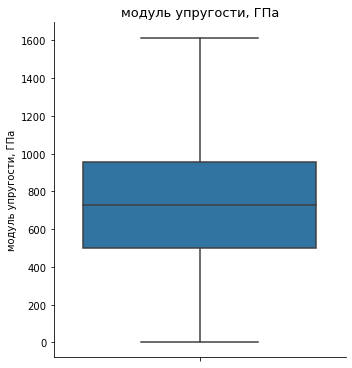

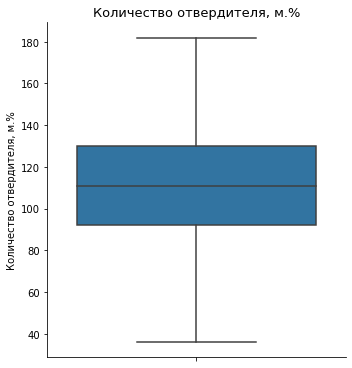

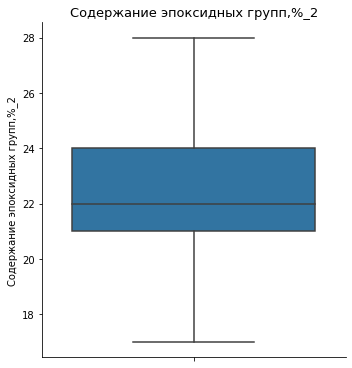

...

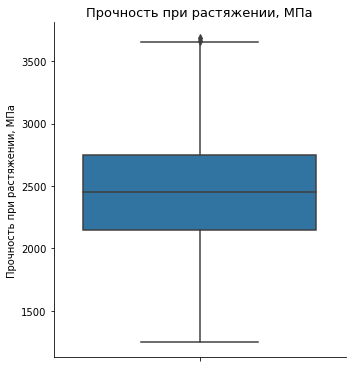

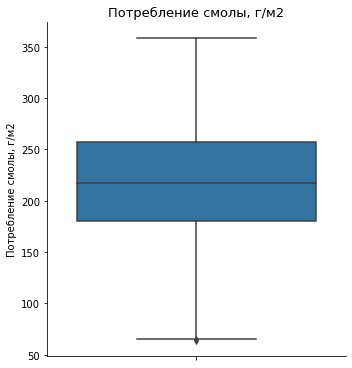

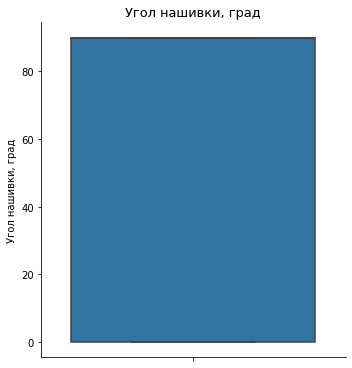

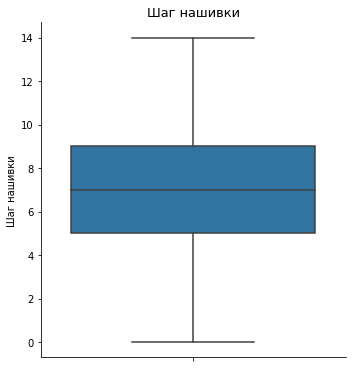

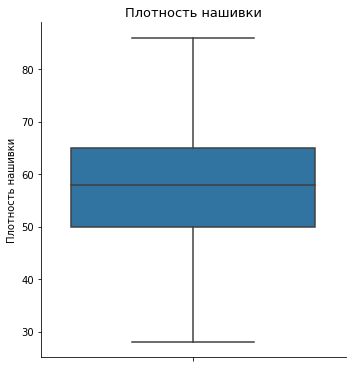

In [28]:
# производим проверку распределения после выборосов

for col in data_set.columns:
        sbn.catplot(y = col, data = data_set, kind = 'box')
        plt.title(col, fontsize = 13) 

In [29]:
# Нормализуем данные с помощью метода MinMaxScaler
# Преобразование показателей путем масштабирования до заданного диапазона. По умолчанию от 0 до 1

scaler = MinMaxScaler()
DS_n = pd.DataFrame(scaler.fit_transform(data_set),
           columns = data_set.columns, index = data_set.index)
DS_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
7,0.500000,0.306878,0.330440,0.520548,0.454545,0.512077,0.293798,0.6250,0.225502,0.189831,0.0,0.500000,0.327586
13,0.500000,0.518519,0.350899,0.636986,0.363636,0.584541,0.363566,0.5000,0.494465,0.528814,0.0,0.642857,0.551724
16,0.666667,0.253968,0.192808,0.636986,0.363636,0.584541,0.162016,0.3125,0.717507,0.528814,0.0,0.714286,0.500000
18,0.833333,0.280423,0.333540,0.636986,0.363636,0.584541,0.293798,0.6250,0.225502,0.189831,0.0,0.714286,0.724138
23,0.500000,0.447090,0.703658,0.698630,0.454545,0.270531,0.430233,1.0000,0.548175,0.620339,1.0,0.285714,0.724138
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.333333,0.444444,0.564786,0.349315,0.272727,0.705314,0.161240,0.5000,0.466175,0.206780,1.0,0.642857,0.327586
1019,0.500000,0.703704,0.274644,0.753425,0.272727,0.362319,0.271318,0.5000,0.455105,0.183051,1.0,0.785714,0.448276
1020,0.500000,0.497354,0.257285,0.513699,0.636364,0.333333,0.572868,0.6250,0.579336,0.586441,1.0,0.285714,0.689655
1021,0.666667,0.748677,0.458153,0.719178,0.181818,0.468599,0.496124,0.5625,0.337023,0.450847,1.0,0.428571,0.517241


Смотрим зависимости нормализованного датасета

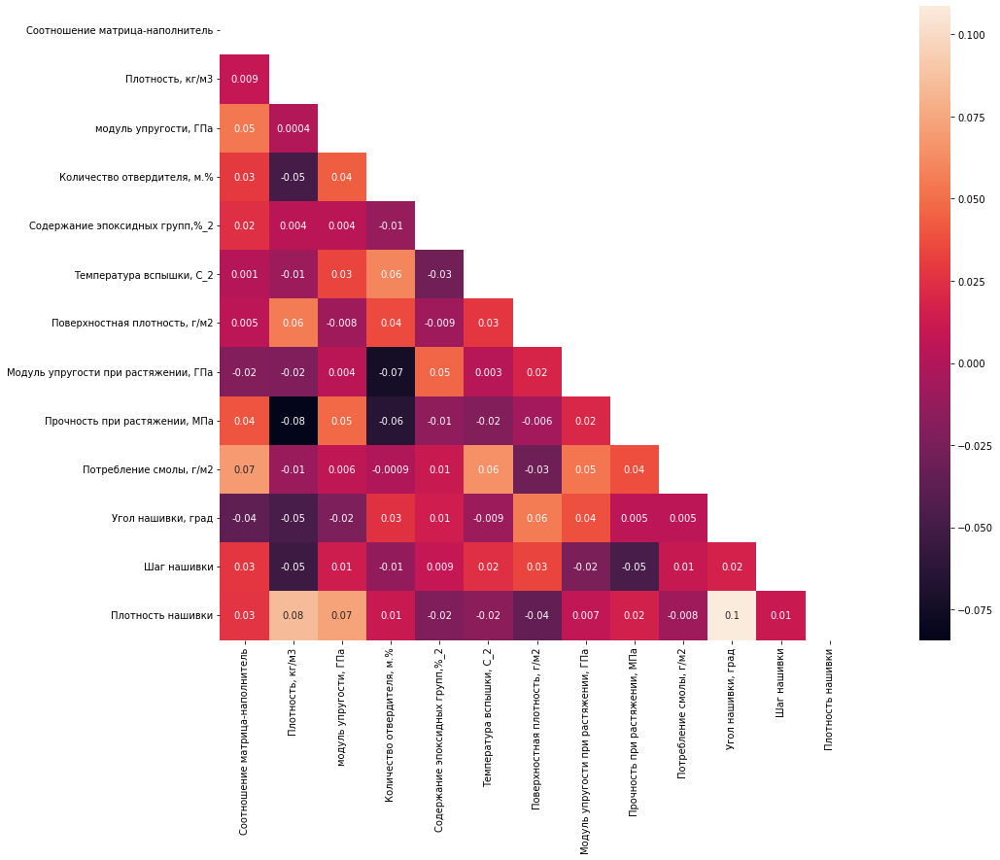

In [30]:
# строим телопвую карту попарной коррекляции нормализованного датасета


fig, ax = plt.subplots(figsize=(24,12))
matrix = np.triu(DS_n.corr())
sbn.heatmap(DS_n.corr(),  annot=True, square=True, mask=matrix,fmt='.1g');



Видим, что данные плохо коррелируются между собой, самый высокий коээфициент 0,08. Тогда как коэффициент должен стремиться к 1.

# 4. Анализ и выявление закономерностей

In [31]:
#смотрим статистику по нормализованным данным без выборосов

DS_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,904.000000,904.000000,904.000000,904.000000,904.000000,904.000000,904.000000,904.000000,904.000000,904.000000,904.000000,904.000000,904.000000
mean,0.493732,0.501349,0.454046,0.512214,0.473049,0.514707,0.372443,0.519151,0.497203,0.522739,0.511062,0.496760,0.506942
std,0.157531,0.188205,0.202629,0.186270,0.215082,0.192626,0.215968,0.192431,0.188661,0.195955,0.500154,0.184445,0.195684
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.333333,0.365079,0.307502,0.383562,0.363636,0.381643,0.206202,0.375000,0.367876,0.393220,0.000000,0.357143,0.379310
50%,0.500000,0.510582,0.450403,0.513699,0.454545,0.516908,0.350388,0.500000,0.494055,0.518644,1.000000,0.500000,0.517241
75%,0.666667,0.624339,0.592064,0.643836,0.636364,0.647343,0.536240,0.625000,0.615826,0.654237,1.000000,0.642857,0.637931
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Выводим графики зависимости для каждого выходного параметра

Соотношение матрица-наполнитель


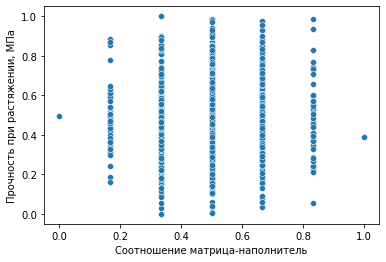




Плотность, кг/м3


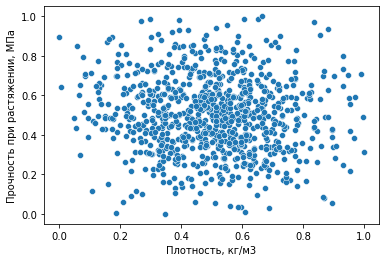




модуль упругости, ГПа


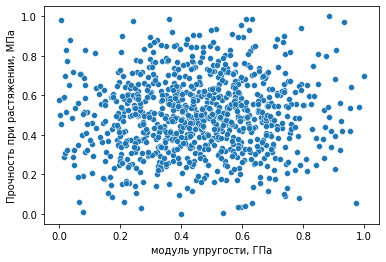




Количество отвердителя, м.%


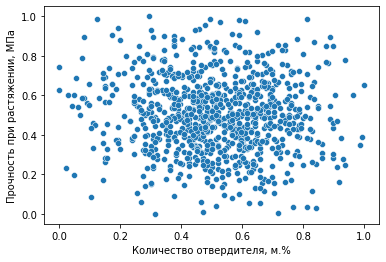




Содержание эпоксидных групп,%_2


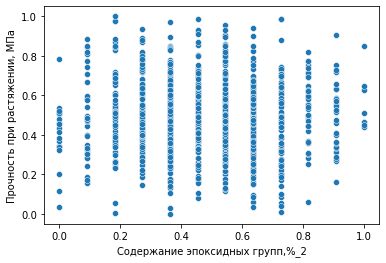




Температура вспышки, С_2


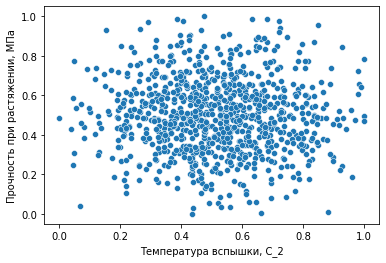




Поверхностная плотность, г/м2


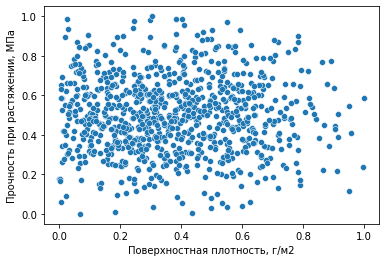




Модуль упругости при растяжении, ГПа


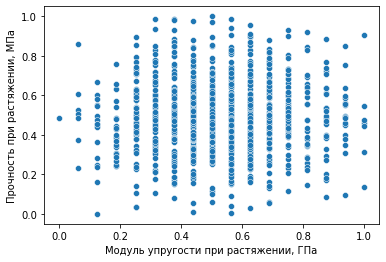




Прочность при растяжении, МПа


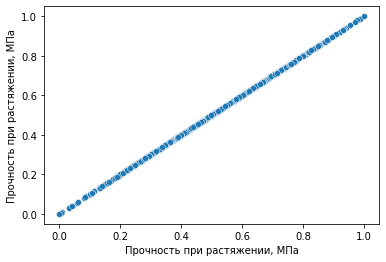




Потребление смолы, г/м2


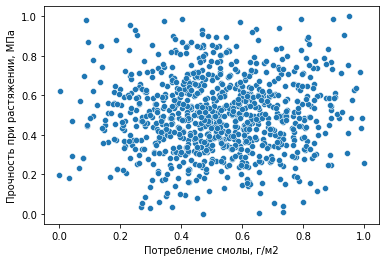




Угол нашивки, град


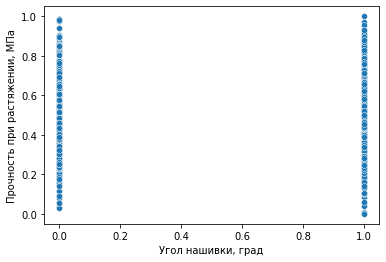




Шаг нашивки


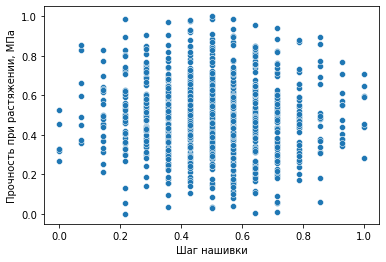




Плотность нашивки


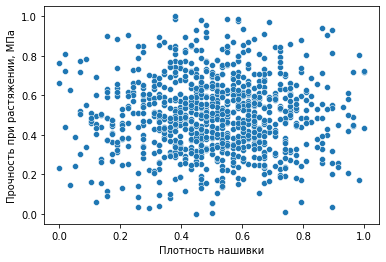

In [32]:
# Смотрим зависимости для "Прочность при растяжении, МПа"

for column in DS_n:
    print(column)
    sbn.scatterplot(x = column , y = "Прочность при растяжении, МПа", data = DS_n);
    plt.show()
    print('\n\n')

Линейной зависимости для показателя 'Прочность при растяжении, МПа' не видим

Соотношение матрица-наполнитель


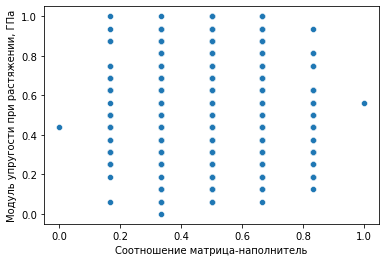




Плотность, кг/м3


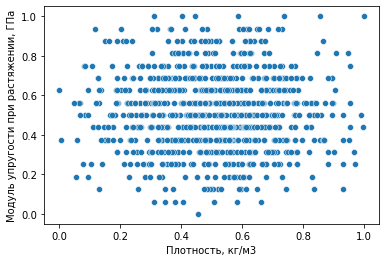




модуль упругости, ГПа


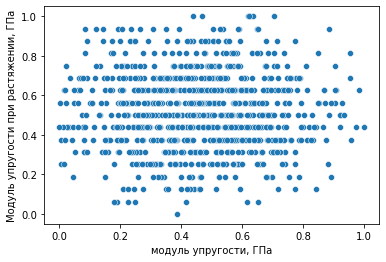




Количество отвердителя, м.%


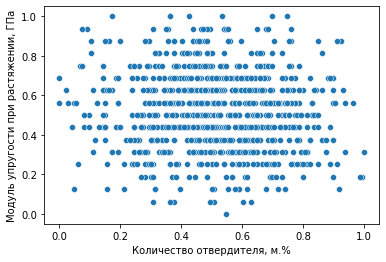




Содержание эпоксидных групп,%_2


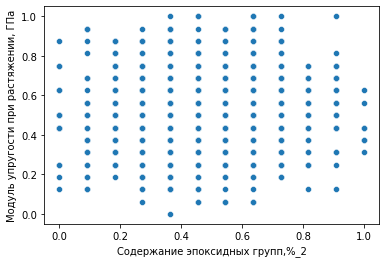




Температура вспышки, С_2


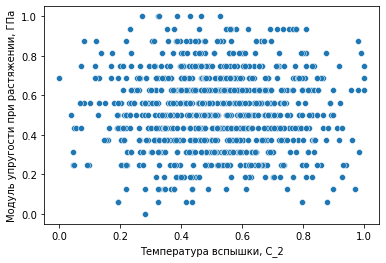




Поверхностная плотность, г/м2


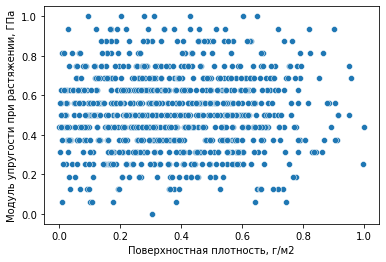




Модуль упругости при растяжении, ГПа


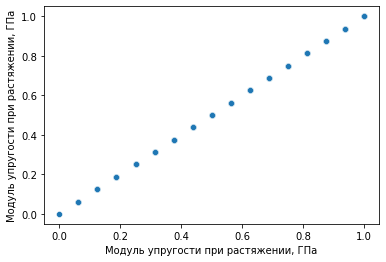




Прочность при растяжении, МПа


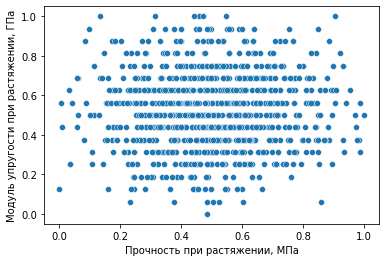




Потребление смолы, г/м2


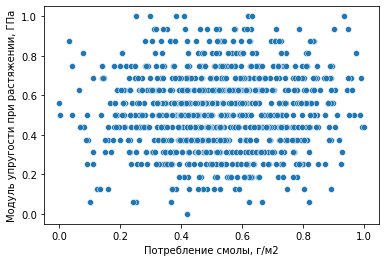




Угол нашивки, град


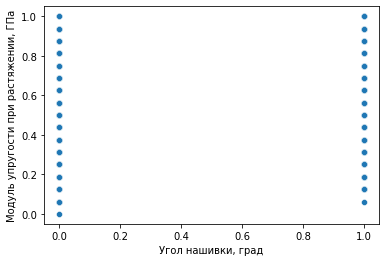




Шаг нашивки


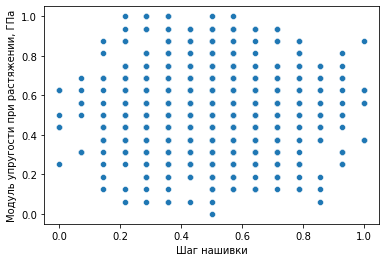




Плотность нашивки


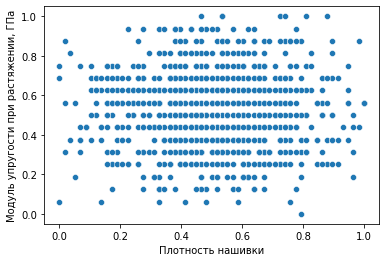

In [33]:
# Смотрим зависимости для "Модуль упругости при растяжении, ГПа"

for column in DS_n:
    print(column)
    sbn.scatterplot(x = column , y = "Модуль упругости при растяжении, ГПа", data = DS_n);
    plt.show()
    print('\n\n')

Соотношение матрица-наполнитель


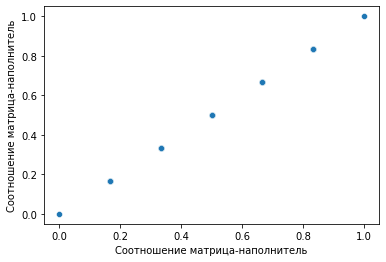




Плотность, кг/м3


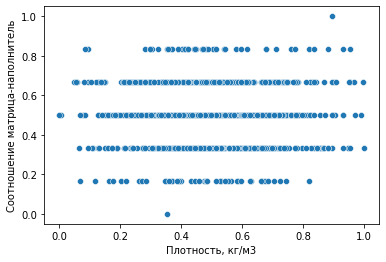




модуль упругости, ГПа


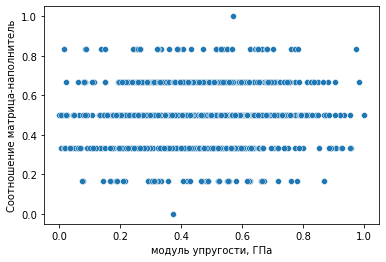




Количество отвердителя, м.%


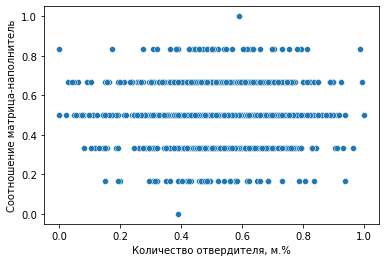




Содержание эпоксидных групп,%_2


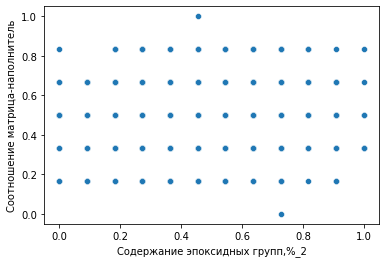




Температура вспышки, С_2


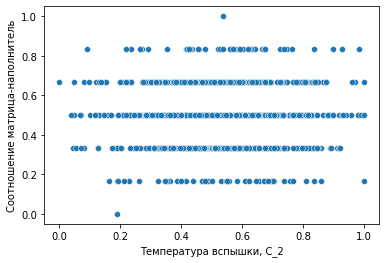




Поверхностная плотность, г/м2


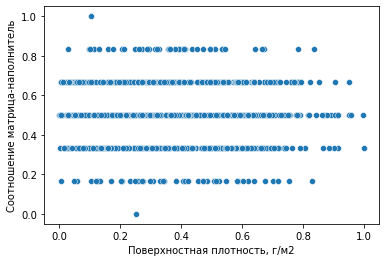




Модуль упругости при растяжении, ГПа


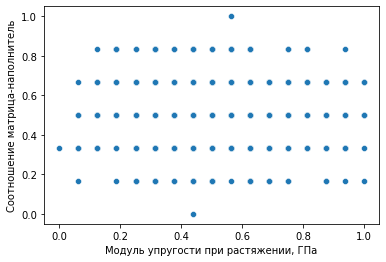




Прочность при растяжении, МПа


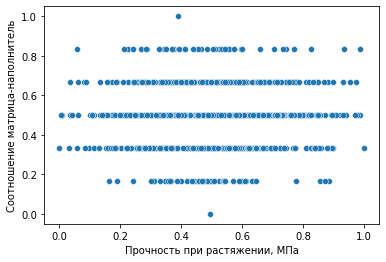




Потребление смолы, г/м2


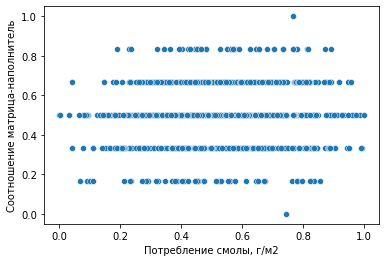




Угол нашивки, град


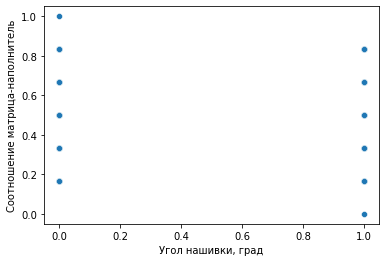




Шаг нашивки


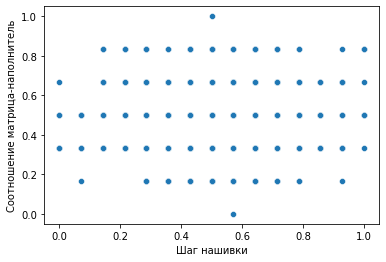




Плотность нашивки


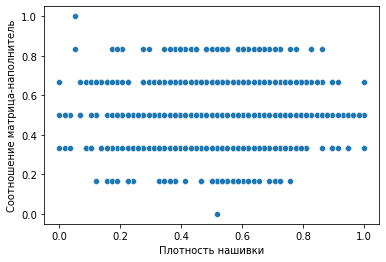

In [34]:
# Смотрим зависимости для "Соотношение матрица-наполнитель"

for column in DS_n:
    print(column)
    sbn.scatterplot(x = column , y = "Соотношение матрица-наполнитель", data = DS_n);
    plt.show()
    print('\n\n')

In [55]:
# Для удобства повторно выводим список столбцов

for col in DS_n.columns:
    print(col)

Соотношение матрица-наполнитель
Плотность, кг/м3
модуль упругости, ГПа
Количество отвердителя, м.%
Содержание эпоксидных групп,%_2
Температура вспышки, С_2
Поверхностная плотность, г/м2
Модуль упругости при растяжении, ГПа
Прочность при растяжении, МПа
Потребление смолы, г/м2
Угол нашивки, град
Шаг нашивки
Плотность нашивки


# 5. Моделирование и решение проблемы

## 5.1 Анализируем 'Прочность при растяжении, МПа'

Производим разделение выборок на учебную и тестовую

In [56]:
# Разделение данных на тестовую (30%) и обучующую выборку (70%)

# подготовливаем наборы для проверки прочности при растяжении, постфикс S - Strength (прочность)

Strength = DS_n['Прочность при растяжении, МПа'] # выходные параметры
train_S = DS_n.drop(['Прочность при растяжении, МПа'], axis = 1) # входные параметры

x_train_S, x_test_S, Y_train_S, Y_test_S= train_test_split( train_S, Strength, test_size = 0.3)



In [57]:
# проверяем размерность

x_train_S.shape, x_test_S.shape, Y_train_S.shape, Y_test_S.shape

((632, 12), (272, 12), (632,), (272,))

### Производим расчет линейной регрессии

In [64]:
# производим расчет логистической регрессии 

regressor = LinearRegression()
regressor.fit(x_train_S, Y_train_S)

# делаем предсказание для тестового набора
predict_S = regressor.predict(x_test_S)
predict_S


array([0.5079405 , 0.4623128 , 0.45994985, 0.46805656, 0.48592738,
       0.52122892, 0.51872716, 0.43575398, 0.48771796, 0.43403024,
       0.50078588, 0.47010679, 0.46486777, 0.48509801, 0.50200255,
       0.42356051, 0.50413325, 0.49912361, 0.49074869, 0.51432992,
       0.41756958, 0.50883707, 0.45756867, 0.50881805, 0.45331959,
       0.47701364, 0.5181496 , 0.47693426, 0.50551986, 0.51226809,
       0.46978074, 0.46251203, 0.4391276 , 0.55047437, 0.50598069,
       0.49006208, 0.53704987, 0.55650794, 0.53721317, 0.4914277 ,
       0.56094496, 0.47301246, 0.49608812, 0.48651759, 0.53377691,
       0.45171364, 0.48221476, 0.50707927, 0.45874935, 0.44539735,
       0.48907446, 0.47897622, 0.50515794, 0.4806254 , 0.50478114,
       0.47764854, 0.51957497, 0.5178176 , 0.50905685, 0.46450477,
       0.50306787, 0.46101074, 0.51695776, 0.57158243, 0.47612567,
       0.49931645, 0.47657968, 0.50183097, 0.53697498, 0.53440909,
       0.47459391, 0.45561849, 0.48311171, 0.47397248, 0.52738

In [65]:
#  случае многомерной линейной регрессии  
# регрессионная модель должна найти наиболее оптимальные коэффициенты для всех атрибутов. 
# Чтобы увидеть, какие коэффициенты выбрала наша регрессионная модель смотрим следующий код:


Tensile_strength_factor = pd.DataFrame(regressor.coef_,train_S.columns, columns=['Прочность при растяжении, МПа'])
Tensile_strength_factor

,"Прочность при растяжении, МПа"
Соотношение матрица-наполнитель,0.071161
"Плотность, кг/м3",-0.113781
"модуль упругости, ГПа",0.050646
"Количество отвердителя, м.%",-0.061259
"Содержание эпоксидных групп,%_2",0.023427
"Температура вспышки, С_2",0.006348
"Поверхностная плотность, г/м2",0.011127
"Модуль упругости при растяжении, ГПа",0.032746
"Потребление смолы, г/м2",0.048658
"Угол нашивки, град",0.005693


In [66]:
# выводим результат

# сравнение с тестовой выборкой
print('MAE, Средняя абсолютная ошибка:', metrics.mean_absolute_error(Y_test_S, predict_S)) 
print('MSE, Среднеквадратическая ошибка:', metrics.mean_squared_error(Y_test_S, predict_S)) 
print('RMSE, корень из Среднеквадратическая ошибка:', np.sqrt(metrics.mean_squared_error(Y_test_S, predict_S)))
print('коэффициент детерминации:', metrics.r2_score(Y_test_S, predict_S))

MAE, Средняя абсолютная ошибка: 0.1509017459045583
MSE, Среднеквадратическая ошибка: 0.03585329469434075
RMSE, корень из Среднеквадратическая ошибка: 0.18934966251446225
коэффициент детерминации: -0.014492003165222922


Вывод: Линейная зависимость параметра "Прочность при растяжении" от любых других параметров отсутствует

In [68]:
dt = pd.DataFrame({'Реальные значения': [Y_test_S], 'Предсказанные': [predict_S]})
dt

,Реальные значения,Предсказанные
0,585 0.040180 206 0.080771 329 0.55637...,"[0.5079404950740946, 0.4623128005365709, 0.459..."


### Прогноз переменной "Модуль упругости при растяжении" методом Случайный лес

In [69]:
# достаем перечень столбцов из нормализованного датасета

cols = DS_n.columns.tolist()
cols

['Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки']

In [70]:
# меняем список местами

cols=cols[-5:]+cols[:-5]
cols

['Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки',
 'Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа']

In [71]:
# переставляем столбцы в датасете

DS_n_1 = DS_n[cols]
DS_n_1

,"Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа"
7,0.225502,0.189831,0.0,0.500000,0.327586,0.500000,0.306878,0.330440,0.520548,0.454545,0.512077,0.293798,0.6250
13,0.494465,0.528814,0.0,0.642857,0.551724,0.500000,0.518519,0.350899,0.636986,0.363636,0.584541,0.363566,0.5000
16,0.717507,0.528814,0.0,0.714286,0.500000,0.666667,0.253968,0.192808,0.636986,0.363636,0.584541,0.162016,0.3125
18,0.225502,0.189831,0.0,0.714286,0.724138,0.833333,0.280423,0.333540,0.636986,0.363636,0.584541,0.293798,0.6250
23,0.548175,0.620339,1.0,0.285714,0.724138,0.500000,0.447090,0.703658,0.698630,0.454545,0.270531,0.430233,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.466175,0.206780,1.0,0.642857,0.327586,0.333333,0.444444,0.564786,0.349315,0.272727,0.705314,0.161240,0.5000
1019,0.455105,0.183051,1.0,0.785714,0.448276,0.500000,0.703704,0.274644,0.753425,0.272727,0.362319,0.271318,0.5000
1020,0.579336,0.586441,1.0,0.285714,0.689655,0.500000,0.497354,0.257285,0.513699,0.636364,0.333333,0.572868,0.6250
1021,0.337023,0.450847,1.0,0.428571,0.517241,0.666667,0.748677,0.458153,0.719178,0.181818,0.468599,0.496124,0.5625


In [72]:
# разделяем датасеты на исходный (x) и выходной (y)

X = DS_n_1.iloc[:, 0:12].values 
y = DS_n_1.iloc[:, 12].values 

In [73]:
# просматриваем выборки, внимательно сверяем, т.к переменные регистрозависимы

X,y

(array([[0.22550226, 0.18983051, 0.        , ..., 0.45454545, 0.51207729,
         0.29379845],
        [0.49446494, 0.52881356, 0.        , ..., 0.36363636, 0.58454106,
         0.36356589],
        [0.71750718, 0.52881356, 0.        , ..., 0.36363636, 0.58454106,
         0.1620155 ],
        ...,
        [0.57933579, 0.58644068, 1.        , ..., 0.63636364, 0.33333333,
         0.57286822],
        [0.33702337, 0.45084746, 1.        , ..., 0.18181818, 0.46859903,
         0.49612403],
        [0.65846658, 0.4440678 , 1.        , ..., 0.90909091, 0.58937198,
         0.5875969 ]]),
 array([0.625 , 0.5   , 0.3125, 0.625 , 1.    , 0.5625, 0.75  , 0.4375,
        0.625 , 0.4375, 0.6875, 0.375 , 0.125 , 0.625 , 0.4375, 0.25  ,
        0.5625, 0.4375, 0.375 , 0.6875, 0.625 , 0.25  , 0.5   , 0.6875,
        0.375 , 0.625 , 0.6875, 0.3125, 0.5   , 0.5   , 0.    , 0.25  ,
        0.3125, 0.6875, 0.625 , 0.4375, 0.5625, 0.375 , 0.375 , 0.5625,
        0.5625, 0.25  , 0.3125, 0.5625, 0.75  , 0

In [74]:
# разделяем выборку на учебную и тестовую

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0) 

In [75]:
# обучаем модель и предсказываем результат

regressor = RandomForestRegressor(n_estimators=20, random_state=0)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

In [76]:
# выводим отклонения

print('MAE, Средняя абсолютная ошибка:', metrics.mean_absolute_error(y_test, y_pred)) 
print('MSE, Среднеквадратическая ошибка:', metrics.mean_squared_error(y_test, y_pred)) 
print('RMSE, корень из Среднеквадратическая ошибка:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('коэффициент детерминации:', metrics.r2_score(y_test, y_pred))

MAE, Средняя абсолютная ошибка: 0.15469898897058823
MSE, Среднеквадратическая ошибка: 0.037648674460018385
RMSE, корень из Среднеквадратическая ошибка: 0.1940326633843343
коэффициент детерминации: -0.07760215924752756


In [77]:
# проверяем разницу между реальными и предсказанными значениями

data = pd.DataFrame({'Реальные': y_test, 'Предсказанные': y_pred})
data

,Реальные,Предсказанные
0,0.6875,0.528125
1,0.5625,0.587500
2,0.6250,0.468750
3,0.3125,0.575000
4,0.8125,0.500000
...,...,...
267,0.5625,0.475000
268,0.4375,0.443750
269,0.3125,0.546875
270,0.7500,0.534375


Производим корректировку работы модели, через подбор параметров

In [78]:
# задаем дипазоны параметров

grid_param = {'bootstrap': [True, False], # использование для построения деревьев подвыборки с возвращением.
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], # Максимальная глубина дерева.
               'max_features': ['auto', 'sqrt'], # Ряд особенностей, которые следует учитывать при поиске лучшего сплита
               'min_samples_leaf': [1, 3, 5], # Минимальное количество выборок, необходимое для конечного узла.
               'min_samples_split': [2, 5, 10], # Минимальное количество выборок
               'n_estimators': [110, 310, 510]} # Количество деревьев в лесу

In [79]:

SP = RandomizedSearchCV(estimator = regressor, 
                     scoring="neg_mean_squared_error", 
                     param_distributions = grid_param,
                     n_iter = 50,
                     cv = 10,
                     verbose=2,
                     random_state=42,
                     n_jobs = -1)

In [80]:
# производим подбор параметров

SP.fit(X_train, y_train) 

Fitting 10 folds for each of 50 candidates, totalling 500 fits


RandomizedSearchCV(cv=10,
                   estimator=RandomForestRegressor(n_estimators=20,
                                                   random_state=0),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 3, 5],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [110, 310, 510]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [81]:
# выводим оптимальные параметры

'''
-0.040873935590511834
RandomForestRegressor(max_depth=90, max_features='sqrt', min_samples_leaf=5,
                      n_estimators=310, random_state=0)
'''

best_result = SP.best_score_
print(best_result)

best_result = SP.best_estimator_
print(best_result)

-0.039468173529909965
RandomForestRegressor(max_depth=10, max_features='sqrt', min_samples_leaf=3,
                      min_samples_split=10, n_estimators=510, random_state=0)


Производим обучение модели с подобранными параметрами

In [86]:
# передаем подобранные параметры

grid_param_model = {'random_state': [0],
                'min_depth': [10],    
               'max_depth': [90],
               'max_features': ['sqrt'],
               'min_samples_leaf': [3],
                'min_samples_split': [10],
               'n_estimators': [510]}

In [87]:
# Подготавливаем модель с подобранными параметрами

SP_model = RandomizedSearchCV(estimator = regressor, 
                     scoring="neg_mean_squared_error", 
                     param_distributions = grid_param,
                     n_iter = 50,
                     cv = 10,
                     verbose=2,
                     random_state=0,
                     n_jobs = -1)

In [88]:
# производим обучение модели

SP_model.fit(X_test, y_test)

Fitting 10 folds for each of 50 candidates, totalling 500 fits


RandomizedSearchCV(cv=10,
                   estimator=RandomForestRegressor(n_estimators=20,
                                                   random_state=0),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 3, 5],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [110, 310, 510]},
                   random_state=0, scoring='neg_mean_squared_error', verbose=2)

In [89]:
# смотрим точность предсказания

best_result = SP_model.best_score_
print(best_result) 

-0.035638008914777204


In [90]:
pred = SP_model.predict(X_test)

In [91]:
# смотрим ошибки

print('MAE, Средняя абсолютная ошибка:', metrics.mean_absolute_error(y_test, pred)) 
print('MSE, Среднеквадратическая ошибка:', metrics.mean_squared_error(y_test, pred)) 
print('RMSE, корень из Среднеквадратическая ошибка:', np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('R2 коэффициент детерминации:', metrics.r2_score(y_test, pred))

MAE, Средняя абсолютная ошибка: 0.09014248003420447
MSE, Среднеквадратическая ошибка: 0.013268716882589673
RMSE, корень из Среднеквадратическая ошибка: 0.11518991658382982
R2 коэффициент детерминации: 0.6202151027041558


In [93]:
# выводим соотношение данных

data = pd.DataFrame({'Реальные': y_test, 'Предсказанные': y_pred})
data

,Реальные,Предсказанные
0,0.6875,0.528125
1,0.5625,0.587500
2,0.6250,0.468750
3,0.3125,0.575000
4,0.8125,0.500000
...,...,...
267,0.5625,0.475000
268,0.4375,0.443750
269,0.3125,0.546875
270,0.7500,0.534375


### Производим расчет многослойного перцептрона (MLP)

Для параметра "Соотношение матрица-наполнитель" используем нейронную сеть MLP

In [94]:
# выводим список столбцов нормализованного датасета

cols = DS_n.columns.tolist()
cols

['Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки']

In [95]:
# переставляем столбцы

cols = cols[-12:] + cols[:-12]
cols

['Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки',
 'Соотношение матрица-наполнитель']

In [96]:
# выводим датасет

n_df = DS_n[cols]
n_df

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель
7,0.306878,0.330440,0.520548,0.454545,0.512077,0.293798,0.6250,0.225502,0.189831,0.0,0.500000,0.327586,0.500000
13,0.518519,0.350899,0.636986,0.363636,0.584541,0.363566,0.5000,0.494465,0.528814,0.0,0.642857,0.551724,0.500000
16,0.253968,0.192808,0.636986,0.363636,0.584541,0.162016,0.3125,0.717507,0.528814,0.0,0.714286,0.500000,0.666667
18,0.280423,0.333540,0.636986,0.363636,0.584541,0.293798,0.6250,0.225502,0.189831,0.0,0.714286,0.724138,0.833333
23,0.447090,0.703658,0.698630,0.454545,0.270531,0.430233,1.0000,0.548175,0.620339,1.0,0.285714,0.724138,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.444444,0.564786,0.349315,0.272727,0.705314,0.161240,0.5000,0.466175,0.206780,1.0,0.642857,0.327586,0.333333
1019,0.703704,0.274644,0.753425,0.272727,0.362319,0.271318,0.5000,0.455105,0.183051,1.0,0.785714,0.448276,0.500000
1020,0.497354,0.257285,0.513699,0.636364,0.333333,0.572868,0.6250,0.579336,0.586441,1.0,0.285714,0.689655,0.500000
1021,0.748677,0.458153,0.719178,0.181818,0.468599,0.496124,0.5625,0.337023,0.450847,1.0,0.428571,0.517241,0.666667


In [97]:
# разделяем исходный и выходной набор данных

train = n_df.iloc[:, 0:12].values 
target = n_df.iloc[:, 12].values 

In [98]:
# производим проверку выборок

train, target

(array([[0.30687831, 0.33044017, 0.52054795, ..., 0.        , 0.5       ,
         0.32758621],
        [0.51851852, 0.35089895, 0.6369863 , ..., 0.        , 0.64285714,
         0.55172414],
        [0.25396825, 0.19280843, 0.6369863 , ..., 0.        , 0.71428571,
         0.5       ],
        ...,
        [0.4973545 , 0.25728456, 0.51369863, ..., 1.        , 0.28571429,
         0.68965517],
        [0.74867725, 0.45815251, 0.71917808, ..., 1.        , 0.42857143,
         0.51724138],
        [0.28042328, 0.25728456, 0.6369863 , ..., 1.        , 0.42857143,
         0.84482759]]),
 array([0.5       , 0.5       , 0.66666667, 0.83333333, 0.5       ,
        0.33333333, 0.33333333, 0.5       , 0.5       , 0.33333333,
        0.33333333, 0.33333333, 0.5       , 0.5       , 0.5       ,
        0.5       , 0.33333333, 0.83333333, 0.33333333, 0.5       ,
        0.5       , 0.5       , 0.16666667, 0.66666667, 0.33333333,
        0.16666667, 0.33333333, 0.66666667, 0.5       , 0.66666667,
 

In [99]:
# производим разделение на учебные и тестовые наборы. Для тестового набора оставляем 30% данных

xtrn, xtest, ytrn, ytest = train_test_split( train,target, test_size=0.3)

In [100]:
# Проверяем размеры выборки

print('Учебная : ', xtrn.shape,  ytrn.shape)
print('Тестовая : ',  xtest.shape, ytest.shape)

Учебная :  (632, 12) (632,)
Тестовая :  (272, 12) (272,)


In [101]:
# Обучаем модель с параметрами по умолчанию
# random_state Определяет генерацию случайных чисел для инициализации весов и смещения, разделение обучающих тестов,
# Передается int для воспроизводимых результатов при нескольких вызовах функций.

'''
max_iter устанавливаем на 500
Максимальное количество итераций. Решатель выполняет итерации до получения совпадения 
или до указанного количества итераций.
'''

mlp_regressor  = MLPRegressor(random_state=392, max_iter=500)
mlp_regressor.fit(xtrn, ytrn)

MLPRegressor(max_iter=500, random_state=392)

In [102]:
# выполняем предсказания, проверку значений и выводим коэффициент детерминации

ypreds = mlp_regressor.predict(xtest)
print(ypreds[:10])
print(ytest[:10])

print('R2 коэффициент детерминации:', metrics.r2_score(ytest, ypreds))

[0.46711962 0.58340477 0.54605706 0.46750576 0.44970743 0.53645741
 0.50051294 0.5151281  0.46964805 0.51096555]
[0.5        0.5        0.33333333 0.16666667 0.66666667 0.5
 0.5        0.5        0.66666667 0.83333333]
R2 коэффициент детерминации: -0.030858092938670145


In [103]:

print("Loss : ", mlp_regressor.loss_)

Loss :  0.012855883080533077


In [104]:
# показывает, что ваша модель предсказывает реакцию 2, когда x равно нулю

print("Number of Intercepts : ", len(mlp_regressor.intercepts_))
[intercept.shape for intercept in mlp_regressor.intercepts_]

Number of Intercepts :  2


[(100,), (1,)]

In [105]:
print("Number of Iterations for Which Estimator Ran : ", mlp_regressor.n_iter_)

Number of Iterations for Which Estimator Ran :  47


In [106]:
print("Name of Output Layer Activation Function : ", mlp_regressor.out_activation_)

Name of Output Layer Activation Function :  identity


Т.к. показатели по умолчанию были не оптимальными, то осуществляем подбор параметров модели

In [107]:
%%time

params = {'activation': ['relu', 'tanh', 'logistic', 'identity'],
          'hidden_layer_sizes':  [(100,), (1,)],
          'solver': ['sgd', 'adam'],
          'alpha': [0.00001,0.0001],
          'learning_rate' : ['constant', 'adaptive', 'invscaling'],
          'verbose':[1]
         }

mlp_regressor_grid = GridSearchCV(MLPRegressor(), params, n_jobs=-1, cv=10)
mlp_regressor_grid.fit(xtrn,ytrn)

Iteration 1, loss = 0.01411958
Iteration 2, loss = 0.01337981
Iteration 3, loss = 0.01412116
Iteration 4, loss = 0.01324207
Iteration 5, loss = 0.01338303
Iteration 6, loss = 0.01310488
Iteration 7, loss = 0.01296114
Iteration 8, loss = 0.01332030
Iteration 9, loss = 0.01310632
Iteration 10, loss = 0.01304277
Iteration 11, loss = 0.01304154
Iteration 12, loss = 0.01293679
Iteration 13, loss = 0.01296142
Iteration 14, loss = 0.01285157
Iteration 15, loss = 0.01310565
Iteration 16, loss = 0.01301056
Iteration 17, loss = 0.01285790
Iteration 18, loss = 0.01308426
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Wall time: 37.5 s


GridSearchCV(cv=10, estimator=MLPRegressor(), n_jobs=-1,
             param_grid={'activation': ['relu', 'tanh', 'logistic', 'identity'],
                         'alpha': [1e-05, 0.0001],
                         'hidden_layer_sizes': [(100,), (1,)],
                         'learning_rate': ['constant', 'adaptive',
                                           'invscaling'],
                         'solver': ['sgd', 'adam'], 'verbose': [1]})

In [108]:
# подбираем оптимальные параметры:

print('Best Parameters : ',mlp_regressor_grid.best_params_)

Best Parameters :  {'activation': 'logistic', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'learning_rate': 'invscaling', 'solver': 'adam', 'verbose': 1}


In [116]:
# Передаем оптимальные параметры

model = MLPRegressor(activation= 'logistic',
     alpha= 0.0001,
     batch_size = 'auto',
     beta_1 = 0.9,
     beta_2 = 0.999,
     early_stopping = False,
     epsilon = 1e-08,
     hidden_layer_sizes = (100,),
     learning_rate = 'invscaling',
     learning_rate_init = 0.001,
     max_fun = 15000,
     max_iter = 200,
     momentum = 0.9,
     n_iter_no_change = 10,
     nesterovs_momentum= True,
     power_t = 0.5,
     random_state = None,
     shuffle = True,
     solver = 'adam',
     tol = 0.0001,
     validation_fraction = 0.1,
     verbose = 1,
     warm_start = False)

In [119]:
# обучаем модель на учебных данных

model.fit(xtrn,  ytrn)

Iteration 1, loss = 0.01764911
Iteration 2, loss = 0.01607731
Iteration 3, loss = 0.01366001
Iteration 4, loss = 0.01418241
Iteration 5, loss = 0.01390239
Iteration 6, loss = 0.01302744
Iteration 7, loss = 0.01364755
Iteration 8, loss = 0.01288340
Iteration 9, loss = 0.01343002
Iteration 10, loss = 0.01310052
Iteration 11, loss = 0.01305096
Iteration 12, loss = 0.01292676
Iteration 13, loss = 0.01293272
Iteration 14, loss = 0.01290822
Iteration 15, loss = 0.01292702
Iteration 16, loss = 0.01292667
Iteration 17, loss = 0.01291066
Iteration 18, loss = 0.01288340
Iteration 19, loss = 0.01292629
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


MLPRegressor(activation='logistic', learning_rate='invscaling', verbose=1)

In [120]:
# делаем предсказания

expected_y  = ytest
predicted_y = model.predict(xtest)

In [121]:
# сравниваем результаты

ytest, predicted_y

(array([0.5       , 0.5       , 0.33333333, 0.16666667, 0.66666667,
        0.5       , 0.5       , 0.5       , 0.66666667, 0.83333333,
        0.5       , 0.66666667, 0.5       , 0.16666667, 0.5       ,
        0.5       , 0.33333333, 0.5       , 0.66666667, 0.83333333,
        0.33333333, 0.5       , 0.33333333, 0.66666667, 0.5       ,
        0.5       , 0.16666667, 0.66666667, 0.5       , 0.33333333,
        0.5       , 0.33333333, 0.16666667, 0.33333333, 0.5       ,
        0.66666667, 0.66666667, 0.5       , 0.5       , 0.5       ,
        0.5       , 0.66666667, 0.5       , 0.5       , 0.66666667,
        0.33333333, 0.83333333, 0.33333333, 0.5       , 0.5       ,
        0.33333333, 0.33333333, 0.33333333, 0.5       , 0.16666667,
        0.5       , 0.16666667, 0.5       , 0.5       , 0.5       ,
        0.33333333, 0.33333333, 0.66666667, 0.5       , 0.66666667,
        0.66666667, 0.66666667, 0.33333333, 0.5       , 0.66666667,
        0.5       , 0.5       , 0.5       , 0.33

In [122]:
# проверяем остатки

print('MAE, Средняя абсолютная ошибка:', metrics.mean_absolute_error(ytest, predicted_y)) 
print('MSE, Среднеквадратическая ошибка:', metrics.mean_squared_error(ytest, predicted_y)) 
print('RMSE, корень из Среднеквадратическая ошибка:', np.sqrt(metrics.mean_squared_error(ytest, predicted_y)))
print('R2 коэффициент детерминации:', metrics.r2_score(ytest, predicted_y))

MAE, Средняя абсолютная ошибка: 0.11201323250236818
MSE, Среднеквадратическая ошибка: 0.022395502464710462
RMSE, корень из Среднеквадратическая ошибка: 0.14965126950584304
R2 коэффициент детерминации: -0.01073826580647319


In [123]:
# создаем функцию для отрисовки модели

def plot_loss(model):
        plt.plot(model.loss_curve_, label = 'loss')
        plt.ylim([0, 1])
        plt.xlabel('Epoha')
        plt.ylabel('MAE: [Соотношение матрица-наполнитель]')
        plt.legend()
        plt.grid(True)

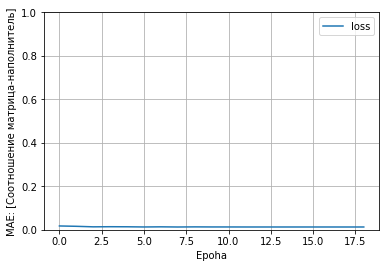

In [124]:
# строим график соотношения матрицы-наполнителя и эпох

plot_loss(model)

In [125]:
# производим сравнение данных

data = pd.DataFrame({'Реальные': [expected_y] , 'Предсказанные': [predicted_y]})
data

,Реальные,Предсказанные
0,"[0.5, 0.5, 0.3333333333333333, 0.1666666666666...","[0.49192389450344437, 0.48145027656022116, 0.4..."


In [126]:
res = model.predict(xtest)
print (model.coefs_)
print (model.n_layers_)
print (model.n_outputs_)
print (model.out_activation_)
print ("res: ",res)

[array([[ 0.01038744,  0.12002111, -0.09447334, ...,  0.07006736,
         0.01350995,  0.05735637],
       [ 0.05816532, -0.10530243,  0.01415493, ...,  0.08756568,
        -0.05134205, -0.01957931],
       [-0.07456692,  0.01958494,  0.04246866, ...,  0.0658822 ,
         0.09610645,  0.11012654],
       ...,
       [-0.12359336,  0.05977211, -0.11146268, ...,  0.06716559,
         0.10422563, -0.01424328],
       [-0.12695608,  0.03119868,  0.10528195, ..., -0.04878935,
         0.00455521, -0.01002492],
       [-0.08026493, -0.08470924, -0.00673222, ...,  0.00843605,
        -0.04574344, -0.13157693]]), array([[-0.01243796],
       [ 0.05473693],
       [ 0.05676373],
       [ 0.13579068],
       [ 0.05233656],
       [ 0.03260541],
       [-0.11361954],
       [-0.04671457],
       [-0.07805194],
       [ 0.02019868],
       [ 0.03072202],
       [-0.02680093],
       [ 0.04886984],
       [ 0.13013675],
       [-0.0569805 ],
       [ 0.04460656],
       [ 0.12164713],
       [-0.

In [127]:
ytest = [ytest]
ytest = np.array(ytest).reshape(-1,1)
ytest.shape

(272, 1)

In [128]:
# модель на тестовых данных

model.fit(xtest,  ytest)

Iteration 1, loss = 0.03466509
Iteration 2, loss = 0.01556923
Iteration 3, loss = 0.01143468
Iteration 4, loss = 0.01534370
Iteration 5, loss = 0.01735112
Iteration 6, loss = 0.01524941
Iteration 7, loss = 0.01212960
Iteration 8, loss = 0.01124890
Iteration 9, loss = 0.01209432
Iteration 10, loss = 0.01316322
Iteration 11, loss = 0.01313414
Iteration 12, loss = 0.01224021
Iteration 13, loss = 0.01126406
Iteration 14, loss = 0.01120303
Iteration 15, loss = 0.01142428
Iteration 16, loss = 0.01156315
Iteration 17, loss = 0.01139915
Iteration 18, loss = 0.01114146
Iteration 19, loss = 0.01100881
Iteration 20, loss = 0.01108186
Iteration 21, loss = 0.01129894
Iteration 22, loss = 0.01131972
Iteration 23, loss = 0.01113978
Iteration 24, loss = 0.01104355
Iteration 25, loss = 0.01098286
Iteration 26, loss = 0.01106040
Iteration 27, loss = 0.01107465
Iteration 28, loss = 0.01100811
Iteration 29, loss = 0.01094432
Iteration 30, loss = 0.01098029
Training loss did not improve more than tol=0.000

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1599: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MLPRegressor(activation='logistic', learning_rate='invscaling', verbose=1)

In [129]:
expected_y  = ytest
predicted_y = model.predict(xtest)

In [130]:


print('MAE, Средняя абсолютная ошибка:', metrics.mean_absolute_error(ytest, predicted_y)) 
print('MSE, Среднеквадратическая ошибка:', metrics.mean_squared_error(ytest, predicted_y)) 
print('RMSE, корень из Среднеквадратическая ошибка:', np.sqrt(metrics.mean_squared_error(ytest, predicted_y)))
print('MSLE Среднеквадратическая логарифмическая ошибка:', metrics.r2_score(ytest, predicted_y))
print('R2 коэффициент детерминации:', metrics.r2_score(ytest, predicted_y))

MAE, Средняя абсолютная ошибка: 0.11298521944781215
MSE, Среднеквадратическая ошибка: 0.02202805788668747
RMSE, корень из Среднеквадратическая ошибка: 0.14841852272101172
MSLE Среднеквадратическая логарифмическая ошибка: 0.005844987735445062
R2 коэффициент детерминации: 0.005844987735445062


In [131]:

def plot_loss(model):
        plt.plot(model.loss_curve_, label = 'loss')
        plt.ylim([0, 0.5])
        plt.xlabel('Epoha')
        plt.ylabel('MAE:[Соотношение матрица-наполнитель]')
        plt.legend()
        plt.grid(True)

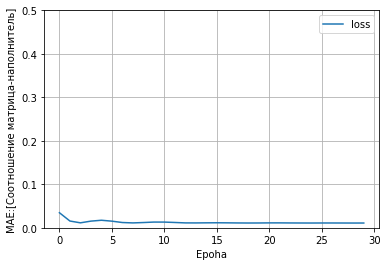

In [132]:
# строим новый график с корректированной осью Y

plot_loss(model)

Коэффициент детерминации близок к 0, что говорит об отсутствии обобщающей способности у этой модели нейросети.
Соотношение матрица-наполнитель эта нейросеть предсказать не может.